In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/schizophrenia-symptoms/SchizophreniaSymptomnsData.csv


# Load Dataset

In [2]:
data = pd.read_csv('/kaggle/input/schizophrenia-symptoms/SchizophreniaSymptomnsData.csv')
data

,Name,Age,Gender,Marital_Status,Fatigue,Slowing,Pain,Hygiene,Movement,Schizophrenia
0,Leslie Goodwin,68,Female,Single,0.698075,0.123064,0.375303,0.234639,0.251869,Elevated Proneness
1,Dr. Troy Castaneda,88,Male,Married,0.049245,-0.042080,0.432807,0.501238,0.379948,Moderate Proneness
2,Chelsey Allen,67,Female,Married,0.651995,0.187117,NaN,0.301942,0.302588,Elevated Proneness
3,Dr. Devin Skinner DVM,95,Female,Widowed,0.036324,0.580808,0.005356,0.306968,0.813618,Moderate Proneness
4,Megan Mendez,81,Female,Widowed,0.926727,0.484202,0.702405,0.736054,0.579448,High Proneness
...,...,...,...,...,...,...,...,...,...,...
4995,Anna Blevins,61,Female,Single,0.933016,0.505532,1.010435,0.868590,0.552105,High Proneness
4996,Robert Frazier,60,Female,Single,0.260125,0.625811,-0.076161,0.079046,0.593206,Moderate Proneness
4997,Louis Flores,62,Male,Married,0.248583,NaN,0.596990,0.119659,0.782998,Moderate Proneness
4998,Julie Nguyen,76,Female,Widowed,0.265702,0.525682,0.546284,0.402468,0.222236,Moderate Proneness


In [3]:
data.shape

(5000, 10)

In [4]:
data.describe()

,Age,Fatigue,Slowing,Pain,Hygiene,Movement
count,5000.00000,4756.000000,4771.000000,4758.000000,5000.000000,5000.000000
mean,74.83340,0.503835,0.499524,0.499612,0.499717,0.499952
std,9.57787,0.296123,0.295365,0.294886,0.294907,0.289860
min,55.00000,-0.095115,-0.094843,-0.095771,-0.094284,-0.089272
25%,67.00000,0.247056,0.245795,0.251174,0.248998,0.254143
50%,75.00000,0.506278,0.502403,0.498051,0.501223,0.503340
75%,83.00000,0.759499,0.744812,0.749946,0.751029,0.741253
max,95.00000,1.091136,1.092146,1.090027,1.086922,1.088914


In [5]:
data.columns

Index(['Name', 'Age', 'Gender', 'Marital_Status', 'Fatigue', 'Slowing', 'Pain',
       'Hygiene', 'Movement', 'Schizophrenia'],
      dtype='object')

# Observe data types

In [6]:
data.dtypes

Name               object
Age                 int64
Gender             object
Marital_Status     object
Fatigue           float64
Slowing           float64
Pain              float64
Hygiene           float64
Movement          float64
Schizophrenia      object
dtype: object

# Observe Schizophrenia column

In [7]:
types_of_schizophrenia = data['Schizophrenia'].unique()

for i in types_of_schizophrenia:
    print(i)

Elevated Proneness
Moderate Proneness
High Proneness
Low Proneness
Very High Proneness


In [8]:
data['Schizophrenia'].value_counts()

Schizophrenia
Elevated Proneness     3077
High Proneness          953
Moderate Proneness      912
Low Proneness            45
Very High Proneness      13
Name: count, dtype: int64

# Identify Null values

In [9]:
data.isnull().sum()

Name                0
Age                 0
Gender              0
Marital_Status      0
Fatigue           244
Slowing           229
Pain              242
Hygiene             0
Movement            0
Schizophrenia       0
dtype: int64

# Fill null values 

In [10]:
data.fillna(data.mode(), inplace=True)
data.isnull().sum()

Name               0
Age                0
Gender             0
Marital_Status     0
Fatigue            6
Slowing           12
Pain               9
Hygiene            0
Movement           0
Schizophrenia      0
dtype: int64

# Observe data by histogram

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Fatigue'}>],
       [<Axes: title={'center': 'Slowing'}>,
        <Axes: title={'center': 'Pain'}>],
       [<Axes: title={'center': 'Hygiene'}>,
        <Axes: title={'center': 'Movement'}>]], dtype=object)

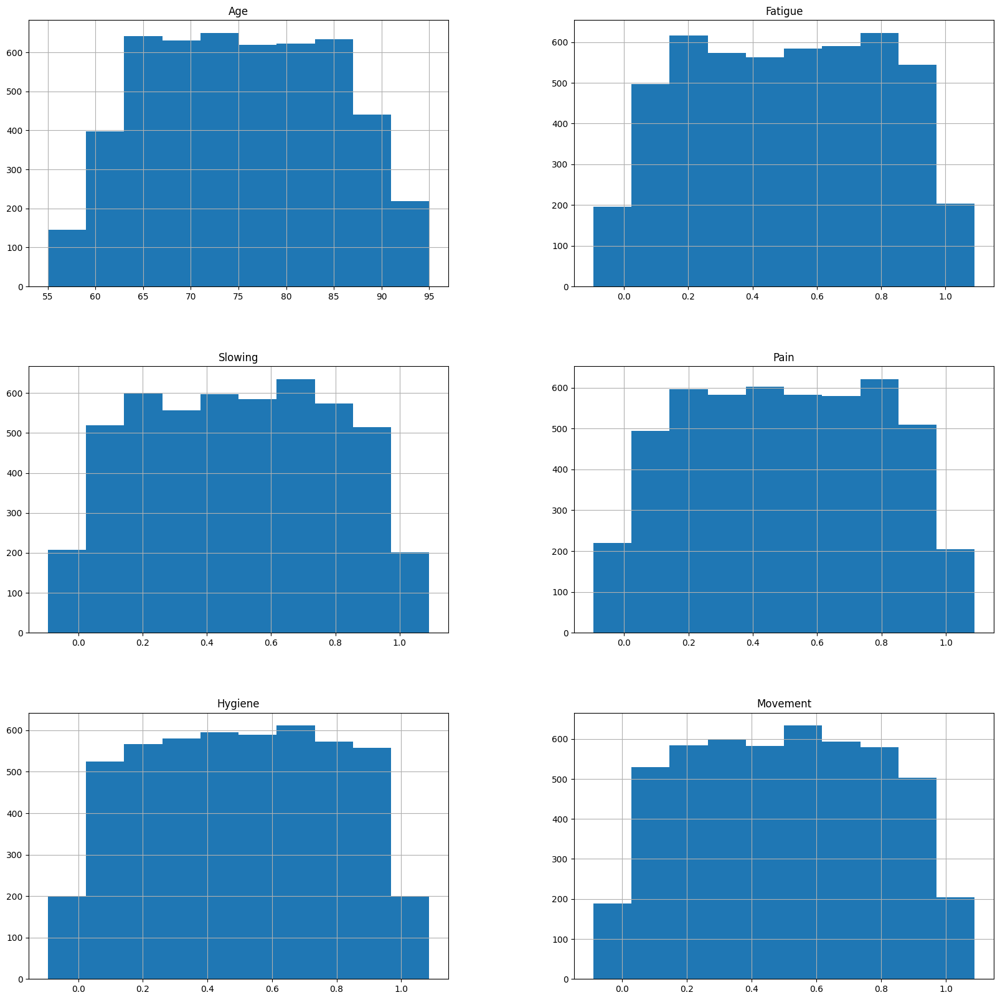

In [11]:
data.hist(figsize = (20,20))


# Observe data by scatter matrix

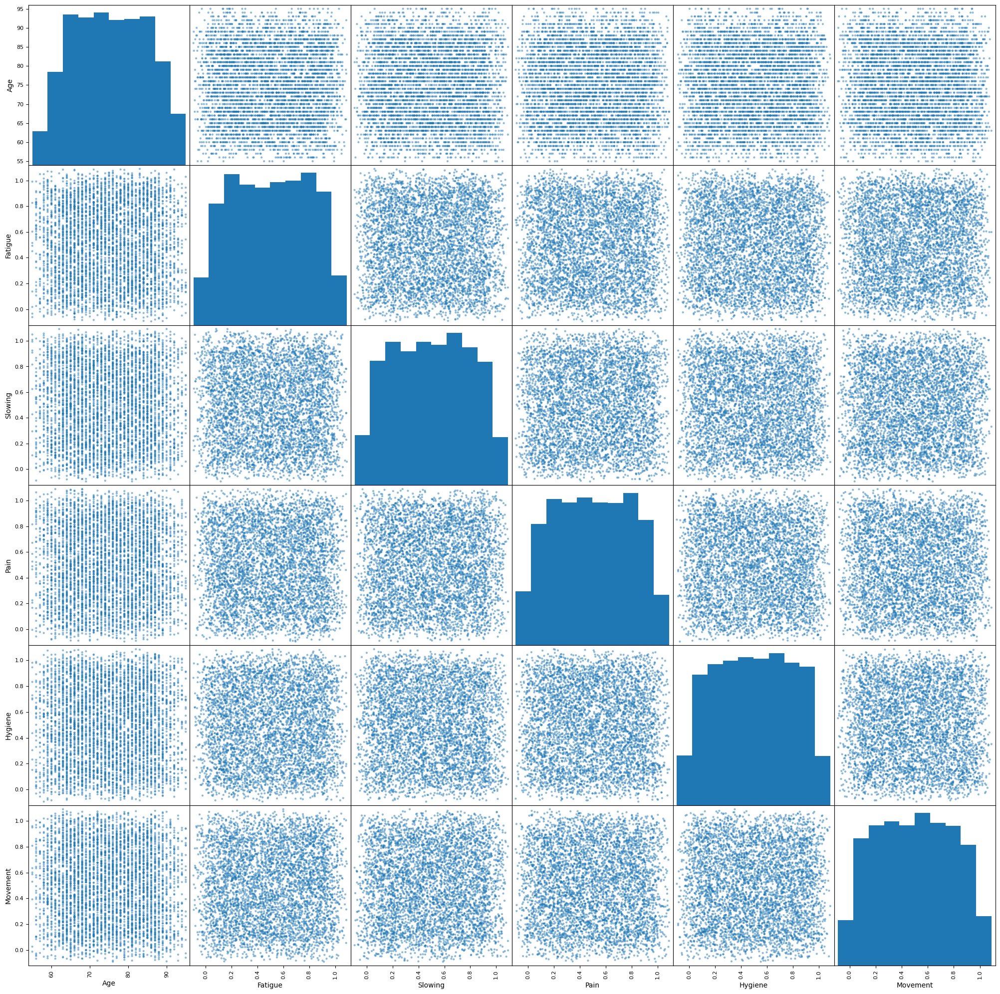

In [12]:
from pandas.plotting import scatter_matrix
p=scatter_matrix(data,figsize=(25, 25))

In [13]:
import warnings

warnings.filterwarnings("ignore")

# Observe data by pairplot according to traget column

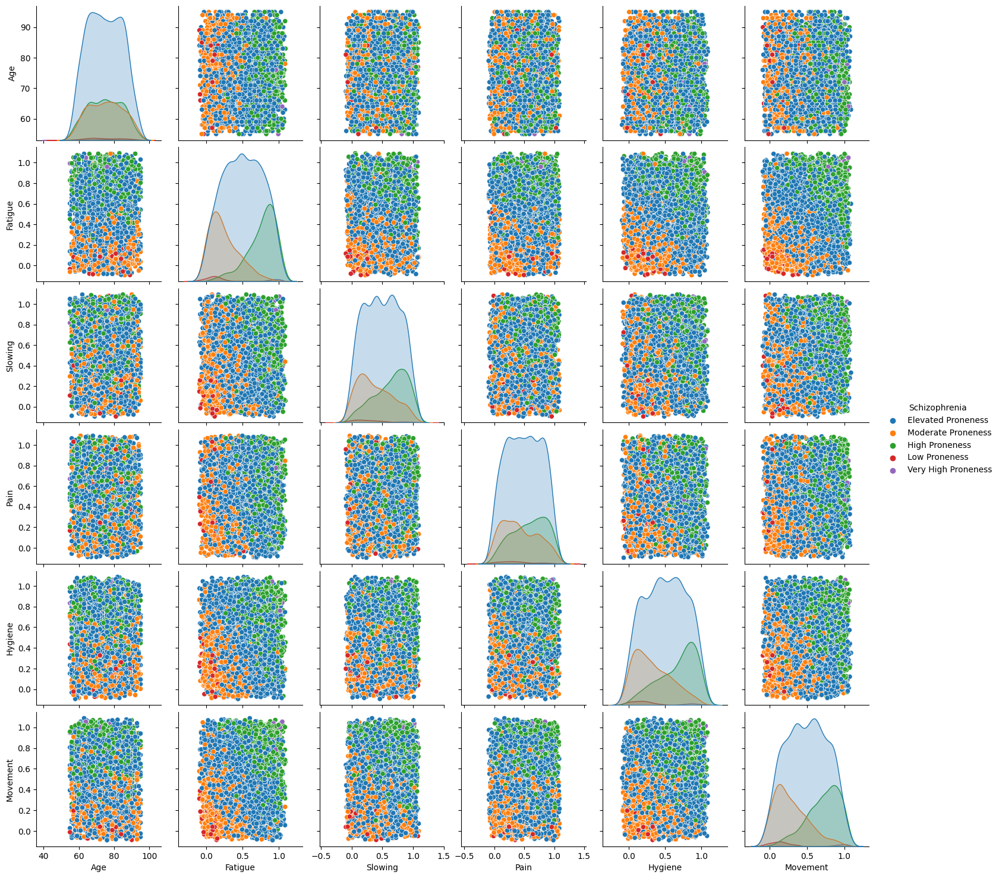

In [14]:
import seaborn as sns

sns.pairplot(data, hue = 'Schizophrenia')

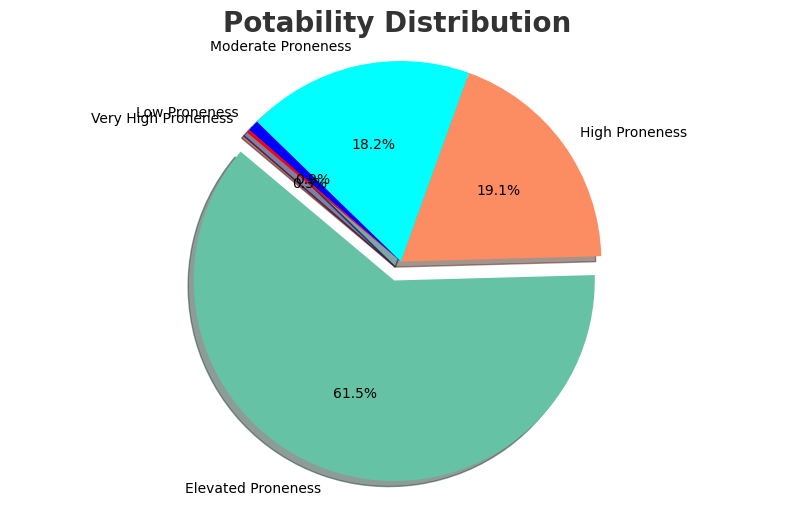

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

potability_counts = data['Schizophrenia'].value_counts()

colors = ['#66c2a5', '#fc8d62', 'cyan', 'blue', 'red']

explode = [0.1] + [0] * (len(potability_counts) - 1)

plt.figure(figsize=(10, 6))
plt.pie(
    potability_counts,
    labels=potability_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors[:len(potability_counts)],  
    explode=explode,
    shadow=True
)
plt.title('Potability Distribution', fontsize=20, fontweight='bold', color='#333333')
plt.axis('equal')
plt.show()


In [16]:
import plotly.express as px

fig = px.scatter(data, x="Age", y="Schizophrenia", color="Gender")
fig.show()

# Identify input and output as X and y

In [17]:
X = data.drop(['Schizophrenia', 'Name'], axis=1)
y = data['Schizophrenia']

In [18]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [19]:
data.columns

Index(['Name', 'Age', 'Gender', 'Marital_Status', 'Fatigue', 'Slowing', 'Pain',
       'Hygiene', 'Movement', 'Schizophrenia'],
      dtype='object')

# Use Onehotencoder for gender and marital status column and standardscaler for all others numeric column

In [20]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

ohe = ['Gender', 'Marital_Status']  
scale = ['Age','Fatigue', 'Slowing', 'Pain','Hygiene', 'Movement']

In [21]:
#preprocessor = ColumnTransformer(
#    transformers=[
#        ('scale', StandardScaler(), scale),  
#        ('ohe', OneHotEncoder(), ohe)  
#    ]
#)

In [22]:
from sklearn.impute import SimpleImputer


preprocessor = ColumnTransformer(
    transformers=[
        ('scale', Pipeline([
            ('imputer', SimpleImputer(strategy='mean')), 
            ('scaler', StandardScaler())
        ]), scale),
        ('ohe', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  
            ('encoder', OneHotEncoder())
        ]), ohe)
    ]
)

# Try randomforestclassifier to observe results

In [23]:
from sklearn.ensemble import RandomForestClassifier

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier())
])

# Using Label encoder for the target column

In [24]:
label_encoder = LabelEncoder()
y_train_label = label_encoder.fit_transform(y_train)
y_test_label = label_encoder.transform(y_test)

In [25]:
pipeline.fit(X_train, y_train_label)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('scale',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age', 'Fatigue', 'Slowing',
                                                   'Pain', 'Hygiene',
                                                   'Movement']),
                                                 ('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder())]),
                                                  ['Gender',
                                                   'Marital_Status'])])),
                ('classifier', RandomForestClassifier())])

In [26]:
accuracy = pipeline.score(X_test, y_test_label)
print(f'Model Accuracy: {accuracy}')

Model Accuracy: 0.876


# Randomforest classifier model accuracy is 87.5, Lets check others model

# Logistic Regression

In [27]:
from sklearn.linear_model import LogisticRegression

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression())
])
pipeline.fit(X_train, y_train_label)

accuracy_logreg = pipeline.score(X_test, y_test_label)
print(f'Logistic Regression Model Accuracy: {accuracy_logreg:.4f}')


Logistic Regression Model Accuracy: 0.9370


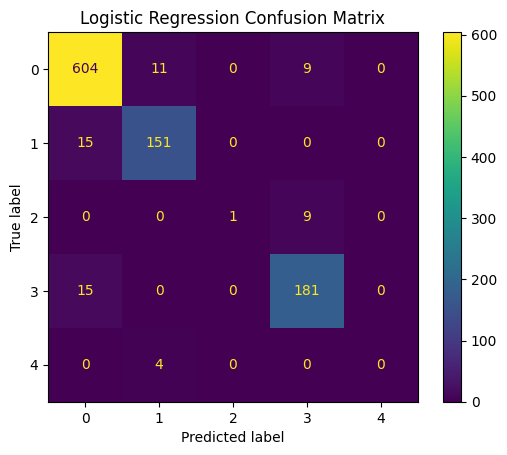

In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


y_pred_logreg = pipeline.predict(X_test)

cm_logreg = confusion_matrix(y_test_label, y_pred_logreg)

ConfusionMatrixDisplay(cm_logreg).plot()
plt.title('Logistic Regression Confusion Matrix')
plt.show()

# Support Vector Machine (SVM)

In [29]:
from sklearn.svm import SVC

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', SVC())
])
pipeline.fit(X_train, y_train_label)

accuracy_svm = pipeline.score(X_test, y_test_label)
print(f'SVM Model Accuracy: {accuracy_svm:.4f}')


SVM Model Accuracy: 0.9280


# Gradient Boosting Classifier

In [30]:
from sklearn.ensemble import GradientBoostingClassifier

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', GradientBoostingClassifier())
])
pipeline.fit(X_train, y_train_label)

accuracy_gb = pipeline.score(X_test, y_test_label)
print(f'Gradient Boosting Model Accuracy: {accuracy_gb:.4f}')


Gradient Boosting Model Accuracy: 0.8860


# Decision Tree Classifier

In [31]:
from sklearn.tree import DecisionTreeClassifier

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier())
])

pipeline.fit(X_train, y_train_label)

accuracy_dt = pipeline.score(X_test, y_test_label)
print(f'Decision Tree Model Accuracy: {accuracy_dt:.4f}')


Decision Tree Model Accuracy: 0.7880


# VotingClassifier

In [32]:
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier

In [33]:
pipelines = {
    'RandomForest': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', RandomForestClassifier(random_state=42))
    ]),
    'SVM': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', SVC(probability=True, random_state=42))
    ]),
    'KNN': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', KNeighborsClassifier())
    ]),
    'LogisticRegression': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', LogisticRegression(random_state=42))
    ]),
    
    'GradientBoosting': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', GradientBoostingClassifier(random_state=42))
    ]),
    'DecisionTree': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', DecisionTreeClassifier(random_state=42))
    ]),
    'CatBoost': Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', CatBoostClassifier(random_state=42, verbose=0))
    ])
}

In [34]:
accuracies = {}

for name, pipeline in pipelines.items():
    pipeline.fit(X_train, y_train_label)
    accuracy = pipeline.score(X_test, y_test_label)
    accuracies[name] = accuracy
    print(f'{name} Accuracy: {accuracy:.4f}')

RandomForest Accuracy: 0.8640
SVM Accuracy: 0.9280
KNN Accuracy: 0.8270
LogisticRegression Accuracy: 0.9370
GradientBoosting Accuracy: 0.8910
DecisionTree Accuracy: 0.7960
CatBoost Accuracy: 0.9270


In [35]:
svm_clf = SVC(probability=True)
knn_clf = KNeighborsClassifier()
lr_clf = LogisticRegression()
gbm_clf = GradientBoostingClassifier(random_state=42)
dt_clf = DecisionTreeClassifier(random_state=42)
catboost_clf = CatBoostClassifier(random_state=42)

In [36]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(
    estimators=[
        ('svm', svm_clf),
        ('knn', knn_clf),
        ('lr', lr_clf),
        ('gbm', gbm_clf),
        ('dt', dt_clf),
        ('catboost', catboost_clf)
    ],
    voting='soft'  
)

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', voting_clf)
])

In [37]:
pipeline.fit(X_train, y_train_label)

accuracy = pipeline.score(X_test, y_test_label)
print(f'Model Accuracy: {accuracy}')

Learning rate set to 0.084924
0:	learn: 1.4598536	total: 8.08ms	remaining: 8.07s
1:	learn: 1.3205571	total: 13.5ms	remaining: 6.75s
2:	learn: 1.2181844	total: 18.9ms	remaining: 6.27s
3:	learn: 1.1270158	total: 24.1ms	remaining: 6s
4:	learn: 1.0536936	total: 29.2ms	remaining: 5.81s
5:	learn: 0.9852704	total: 34.2ms	remaining: 5.67s
6:	learn: 0.9269341	total: 39.3ms	remaining: 5.58s
7:	learn: 0.8765659	total: 44.5ms	remaining: 5.51s
8:	learn: 0.8277106	total: 49.6ms	remaining: 5.46s
9:	learn: 0.7918341	total: 54.5ms	remaining: 5.4s
10:	learn: 0.7546675	total: 59.8ms	remaining: 5.38s
11:	learn: 0.7212534	total: 65.4ms	remaining: 5.38s
12:	learn: 0.6911991	total: 70.9ms	remaining: 5.38s
13:	learn: 0.6625962	total: 76.6ms	remaining: 5.39s
14:	learn: 0.6373613	total: 82.2ms	remaining: 5.4s
15:	learn: 0.6165237	total: 87.6ms	remaining: 5.38s
16:	learn: 0.5956123	total: 92.8ms	remaining: 5.37s
17:	learn: 0.5789806	total: 98.2ms	remaining: 5.36s
18:	learn: 0.5610887	total: 103ms	remaining: 5.33

# XGBClassifier

In [38]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score



categorical_cols = X.select_dtypes(include=['object']).columns

numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ]
)

X_preprocessed = preprocessor.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

xgb_model = XGBClassifier(
    learning_rate=0.01,
    n_estimators=1000,
    max_depth=10,
    objective='multi:softmax',  
    num_class=len(label_encoder.classes_),  
)
xgb_model.fit(X_train, y_train_encoded)

y_pred_encoded = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test_encoded, y_pred_encoded)
print(f"Model accuracy: {accuracy:.4f}")

y_pred = label_encoder.inverse_transform(y_pred_encoded)


Model accuracy: 0.9040


# SHAP

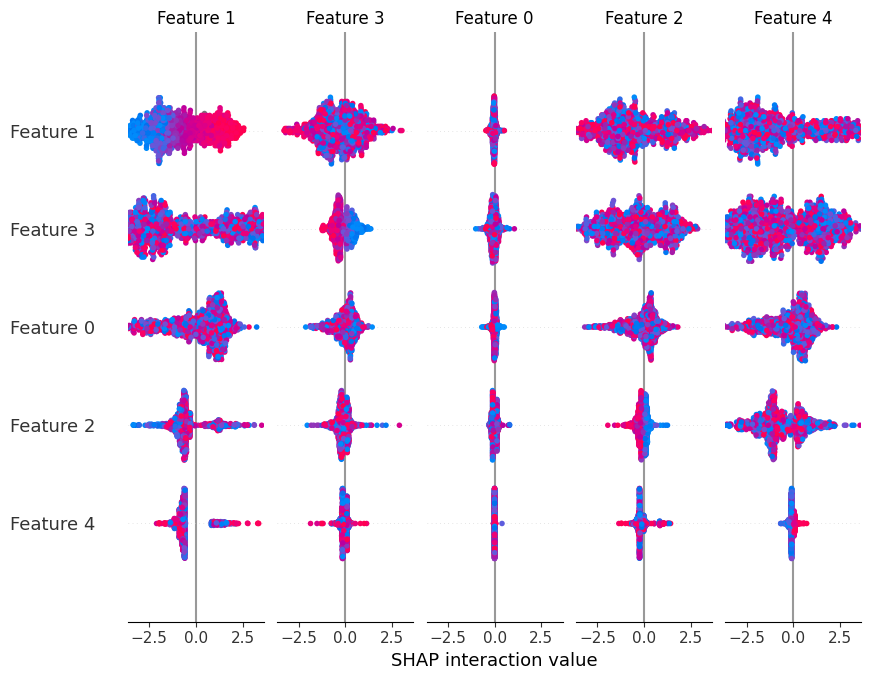

In [39]:
import shap

explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test)


# Confusion Matrix

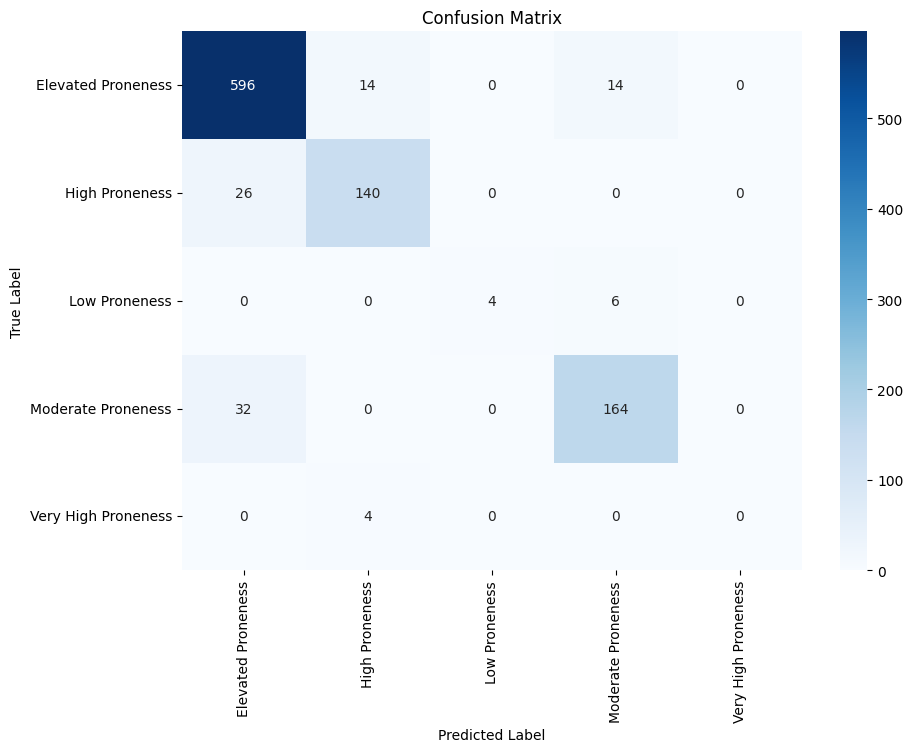

                     precision    recall  f1-score   support

 Elevated Proneness       0.91      0.96      0.93       624
     High Proneness       0.89      0.84      0.86       166
      Low Proneness       1.00      0.40      0.57        10
 Moderate Proneness       0.89      0.84      0.86       196
Very High Proneness       0.00      0.00      0.00         4

           accuracy                           0.90      1000
          macro avg       0.74      0.61      0.65      1000
       weighted avg       0.90      0.90      0.90      1000



In [40]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(y_test_encoded, y_pred_encoded)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(y_test_encoded, y_pred_encoded, target_names=label_encoder.classes_)
print(report)


In [41]:
data

,Name,Age,Gender,Marital_Status,Fatigue,Slowing,Pain,Hygiene,Movement,Schizophrenia
0,Leslie Goodwin,68,Female,Single,0.698075,0.123064,0.375303,0.234639,0.251869,Elevated Proneness
1,Dr. Troy Castaneda,88,Male,Married,0.049245,-0.042080,0.432807,0.501238,0.379948,Moderate Proneness
2,Chelsey Allen,67,Female,Married,0.651995,0.187117,-0.088660,0.301942,0.302588,Elevated Proneness
3,Dr. Devin Skinner DVM,95,Female,Widowed,0.036324,0.580808,0.005356,0.306968,0.813618,Moderate Proneness
4,Megan Mendez,81,Female,Widowed,0.926727,0.484202,0.702405,0.736054,0.579448,High Proneness
...,...,...,...,...,...,...,...,...,...,...
4995,Anna Blevins,61,Female,Single,0.933016,0.505532,1.010435,0.868590,0.552105,High Proneness
4996,Robert Frazier,60,Female,Single,0.260125,0.625811,-0.076161,0.079046,0.593206,Moderate Proneness
4997,Louis Flores,62,Male,Married,0.248583,NaN,0.596990,0.119659,0.782998,Moderate Proneness
4998,Julie Nguyen,76,Female,Widowed,0.265702,0.525682,0.546284,0.402468,0.222236,Moderate Proneness


# Feature Importance

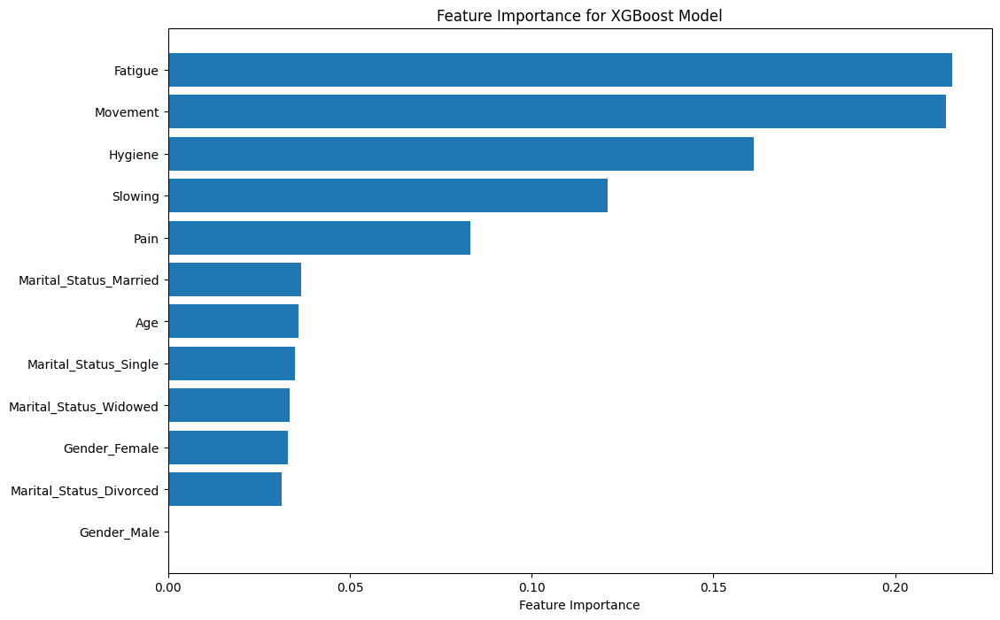

In [42]:
import matplotlib.pyplot as plt
import numpy as np

cat_feature_names = list(preprocessor.named_transformers_['cat'].get_feature_names_out())

feature_names = numerical_cols.tolist() + cat_feature_names

importances = xgb_model.feature_importances_

indices = np.argsort(importances)[::-1]
sorted_feature_names = np.array(feature_names)[indices]
sorted_importances = importances[indices]

plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_importances)), sorted_importances, align='center')
plt.yticks(range(len(sorted_importances)), sorted_feature_names)
plt.xlabel('Feature Importance')
plt.title('Feature Importance for XGBoost Model')
plt.gca().invert_yaxis()  
plt.show()


In [43]:
import pandas as pd

feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': xgb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Feature importances:\n")
print(feature_importances)


Feature importances:

                    Feature  Importance
1                   Fatigue    0.215771
5                  Movement    0.213950
4                   Hygiene    0.161035
2                   Slowing    0.120910
3                      Pain    0.083253
9    Marital_Status_Married    0.036663
0                       Age    0.035938
10    Marital_Status_Single    0.034815
11   Marital_Status_Widowed    0.033364
6             Gender_Female    0.033046
8   Marital_Status_Divorced    0.031255
7               Gender_Male    0.000000


In [44]:
feature_names = preprocessor.get_feature_names_out()
print(feature_names)


['num__Age' 'num__Fatigue' 'num__Slowing' 'num__Pain' 'num__Hygiene'
 'num__Movement' 'cat__Gender_Female' 'cat__Gender_Male'
 'cat__Marital_Status_Divorced' 'cat__Marital_Status_Married'
 'cat__Marital_Status_Single' 'cat__Marital_Status_Widowed']


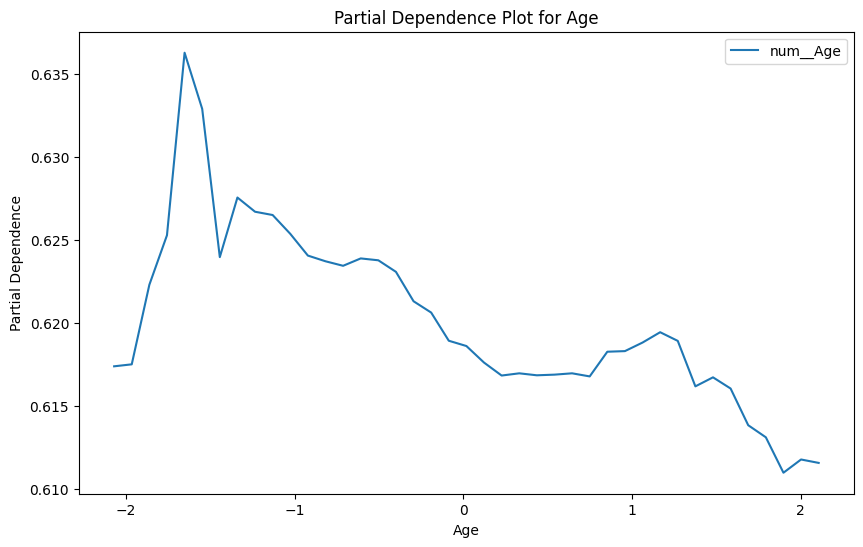

In [45]:
import pandas as pd
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt

X_preprocessed_df = pd.DataFrame(
    X_preprocessed,
    columns=preprocessor.get_feature_names_out()
)

pd_results = partial_dependence(
    xgb_model,
    X_preprocessed_df,
    features=["num__Age"],  
    kind="average"
)

plt.figure(figsize=(10, 6))
values = pd_results['values'][0]  
averages = pd_results['average'][0]  
plt.plot(values, averages, label="num__Age")
plt.xlabel('Age')
plt.ylabel('Partial Dependence')
plt.title('Partial Dependence Plot for Age')
plt.legend()
plt.show()


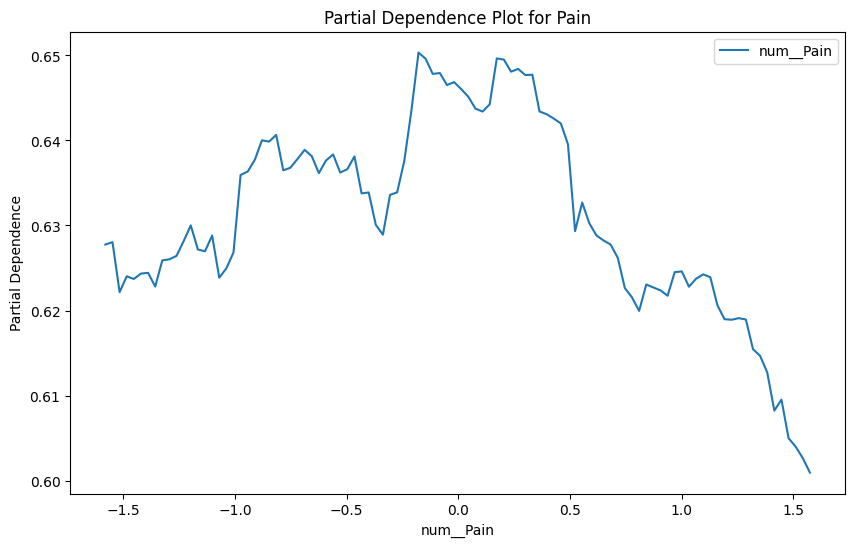

In [46]:
import pandas as pd
from sklearn.inspection import partial_dependence
import matplotlib.pyplot as plt

X_preprocessed_df = pd.DataFrame(
    X_preprocessed,
    columns=preprocessor.get_feature_names_out()
)

pd_results = partial_dependence(
    xgb_model,
    X_preprocessed_df,
    features=["num__Pain"],  
    kind="average"
)

plt.figure(figsize=(10, 6))
values = pd_results['values'][0]  
averages = pd_results['average'][0]  
plt.plot(values, averages, label="num__Pain")
plt.xlabel('num__Pain')
plt.ylabel('Partial Dependence')
plt.title('Partial Dependence Plot for Pain')
plt.legend()
plt.show()


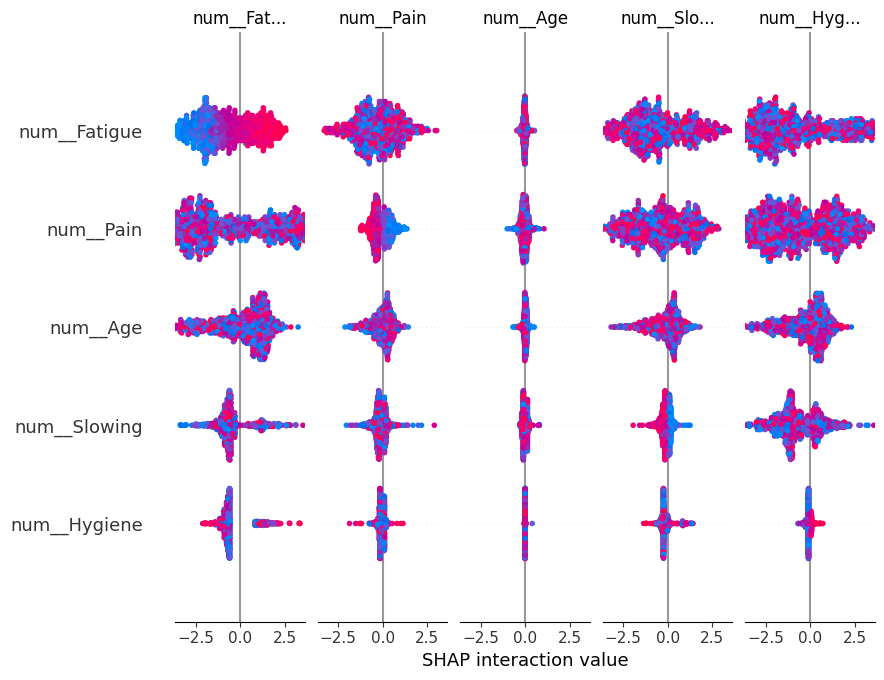

In [47]:
import shap

explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test)

shap.summary_plot(shap_values, X_test, feature_names=preprocessor.get_feature_names_out())


# Counterfactual Explanations

In [48]:

import numpy as np

def generate_counterfactuals(instance, model, feature_names):
    perturbation = np.random.normal(0, 1, size=instance.shape)
    counterfactuals = instance + perturbation
    return counterfactuals

instance = X_test[0:1]
cf = generate_counterfactuals(instance, xgb_model, preprocessor.get_feature_names_out())
print("Counterfactuals:", cf)


Counterfactuals: [[-0.30608448  2.29362846  1.07199785 -2.12298669  2.13543107  2.76696186
   1.34108969 -0.22950783 -1.84400435  0.11457123 -0.47675039  0.59337957]]


# ROC Curve

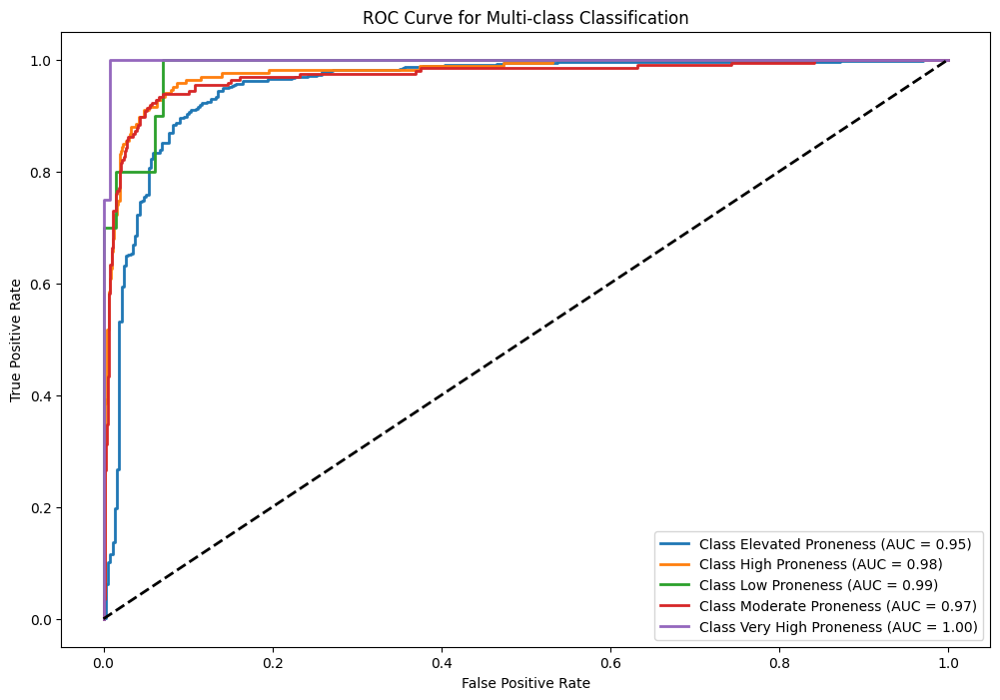

In [49]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_test_bin = label_binarize(y_test, classes=label_encoder.classes_)
y_pred_prob = xgb_model.predict_proba(X_test)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(label_encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(12, 8))
for i in range(len(label_encoder.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {label_encoder.classes_[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-class Classification')
plt.legend(loc='best')
plt.show()


#  ROC AUC Score

In [50]:
from sklearn.metrics import roc_auc_score

roc_auc_initial = roc_auc_score(y_test_encoded, xgb_model.predict_proba(X_test), multi_class='ovr')
print(f"Initial ROC AUC: {roc_auc_initial:.4f}")



Initial ROC AUC: 0.9769


# END